# Talhão 1

In [9]:
import pandas as pd
from scipy.spatial.distance import cdist
import numpy as np
from scipy.stats import t

def get_closest_samples(df_orig, df_interp, coordinate_columns):
    """
    Get the closest samples from the interpolated DataFrame to each point in the original DataFrame.

    Args:
        df_orig (pd.DataFrame): Original DataFrame.
        df_interp (pd.DataFrame): Interpolated DataFrame.
        coordinate_columns (list): List of columns containing coordinates.

    Returns:
        pd.DataFrame: DataFrame with the closest samples from the interpolated DataFrame for each point in the original DataFrame.
    """

    # Extract coordinates from dataframes
    coordinates_orig = df_orig[coordinate_columns].values
    coordinates_interp = df_interp[coordinate_columns].values

    # Calculate distances between all original and interpolated coordinates
    distances = cdist(coordinates_orig, coordinates_interp)

    # Find indices of interpolated coordinates closest to each original coordinate
    closest_indices = np.argmin(distances, axis=1)

    # Ensure indices are within the bounds of the original DataFrame
    closest_indices = np.clip(closest_indices, 0, len(df_interp) - 1)

    # Create a DataFrame with the closest original samples
    closest_samples = df_interp.iloc[closest_indices]

    return closest_samples

def calculate_statistics(dataframe, confidence_level=0.95):
    """
    Calculate descriptive statistics and confidence intervals for a given DataFrame.

    Args:
        dataframe (pd.Series): Input data as a pandas Series.
        confidence_level (float): Confidence level for calculating confidence intervals (default is 0.95).

    Returns:
        pd.DataFrame: DataFrame containing descriptive statistics and confidence intervals.
    """

    # Requested percentiles
    percentiles = [0.25, 0.5, 0.75, 0.8, 0.85, 0.9, 0.95, 0.99]

    # Convert DataFrame to Series
    dataframe = pd.Series(dataframe)

    # Calculate descriptive statistics
    desc_stats_df = dataframe.describe(percentiles=percentiles).T

    # Add additional descriptive statistics
    desc_stats_df['range'] = desc_stats_df['max'] - desc_stats_df['min']
    desc_stats_df['coef_of_variation'] = desc_stats_df['std'] / desc_stats_df['mean']  # Coefficient of variation
    desc_stats_df['iqr'] = desc_stats_df['75%'] - desc_stats_df['25%']  # Interquartile range
    desc_stats_df['skewness'] = dataframe.skew()  # Skewness
    desc_stats_df['kurtosis'] = dataframe.kurtosis()  # Kurtosis

    # Calculate confidence interval for the means
    num_samples = dataframe.count()
    degrees_freedom = num_samples - 1
    margin_of_error = t.ppf((1 + confidence_level) / 2, degrees_freedom) * desc_stats_df['std'] / np.sqrt(num_samples)
    desc_stats_df['confidence_interval_low'] = desc_stats_df['mean'] - margin_of_error
    desc_stats_df['confidence_interval_high'] = desc_stats_df['mean'] + margin_of_error

    return desc_stats_df.T


def compare_dataframes_statistics(df_orig, df_interp):
    """
    Compare statistics between two DataFrames.

    Args:
        df_orig (pd.DataFrame): Original DataFrame.
        df_interp (pd.DataFrame): Interpolated DataFrame.

    Returns:
        pd.DataFrame: Statistics for the interpolated DataFrame.
        pd.DataFrame: Statistics for the original DataFrame.
    """

    filtered_interpolation_stats = pd.DataFrame()
    original_stats = pd.DataFrame()

    # Ensure both DataFrames have the same number of columns and column names
    assert df_orig.shape[1] == df_interp.shape[1], "The DataFrames have different numbers of columns."
    assert list(df_orig.columns) == list(df_interp.columns), "The DataFrames have different column names."

    # Iterate over columns and calculate comparative statistics
    for column_name in df_orig.columns:
        original_values = df_orig[column_name].values
        interpolated_values = df_interp[column_name].values

        # Calculate statistics for the interpolated and original values
        filtered_interpolation_stats[column_name] = calculate_statistics(interpolated_values)
        original_stats[column_name] = calculate_statistics(original_values)

    return filtered_interpolation_stats, original_stats


map1_nutrients_df = pd.read_csv('data/map1/nutrients/nutrients.csv')
map1_universal_interpolation_df = pd.read_csv('data/map1/interpolation/universal_interpolation_df.csv')
map1_ordinary_interpolation_df = pd.read_csv('data/map1/interpolation/ordinary_interpolation_df.csv')
map1_linear_interpolated_df = pd.read_csv('data/map1/interpolation/linear_interpolation_df.csv')
map1_nearest_neighbors_interpolated_df = pd.read_csv('data/map1/interpolation/nearest_neighbors_interpolation_df.csv')
map1_knn_regression_interpolated_df = pd.read_csv('data/map1/interpolation/knn_regression_interpolation_df.csv')
map1_interp1d_df = pd.read_csv('data/map1/interpolation/interp1d_interpolation_df.csv')


# Get closest samples for Universal Kriging interpolation
map1_universal_closest_points = get_closest_samples(map1_nutrients_df, map1_universal_interpolation_df, ['latitude', 'longitude'])

# Get closest samples for Ordinary Kriging interpolation
map1_ordinary_closest_points = get_closest_samples(map1_nutrients_df, map1_ordinary_interpolation_df, ['latitude', 'longitude'])

map1_linear_closest_points = get_closest_samples(map1_nutrients_df, map1_linear_interpolated_df, ['latitude', 'longitude'])

map1_nearest_neighbors_closest_points = get_closest_samples(map1_nutrients_df, map1_nearest_neighbors_interpolated_df, ['latitude', 'longitude'])

map1_knn_regression_closest_points = get_closest_samples(map1_nutrients_df, map1_knn_regression_interpolated_df, ['latitude', 'longitude'])

map1_interp1d_closest_points = get_closest_samples(map1_nutrients_df, map1_interp1d_df, ['latitude', 'longitude'])



# Save results to CSV files
map1_universal_closest_points.to_csv('data/map1/closest_points/universal_interpolation_closest_points.csv')
map1_ordinary_closest_points.to_csv('data/map1/closest_points/ordinary_interpolation_closest_points.csv')
map1_linear_closest_points.to_csv('data/map1/closest_points/linear_interpolation_closest_points.csv')
map1_nearest_neighbors_closest_points.to_csv('data/map1/closest_points/nearest_neighbors_interpolation_closest_points.csv')
map1_knn_regression_closest_points.to_csv('data/map1/closest_points/knn_regression_interpolation_closest_points.csv')
map1_interp1d_closest_points.to_csv('data/map1/closest_points/interp1d_interpolation_closest_points.csv')

# Display the DataFrame with closest points for Universal Kriging interpolation
map1_universal_closest_points

,latitude,longitude,B01.tiff,B02.tiff,B03.tiff,B04.tiff,B05.tiff,B06.tiff,B07.tiff,B08.tiff,...,DRIS_Ca,DRIS_Mg,DRIS_S,DRIS_B,DRIS_Cu,DRIS_Fe,DRIS_Mn,DRIS_Zn,IMS,IBN
1297,-23.192970,-54.437460,0.1211,0.0938,0.0947,0.0725,0.1178,0.2969,0.3731,0.3654,...,0.519493,1.403204,-0.178657,0.761659,-4.112896,2.639319,0.452140,-0.702310,-0.240215,11.551016
3675,-23.195031,-54.437460,0.1234,0.1003,0.1049,0.1028,0.1355,0.2770,0.3425,0.3088,...,0.207361,1.018321,0.008518,0.733449,-3.745955,1.648887,0.302472,-0.434119,-0.190055,9.453071
5934,-23.197093,-54.437460,0.1232,0.0970,0.1012,0.0836,0.1289,0.3063,0.3864,0.3653,...,0.517892,1.386598,0.083058,0.787935,-4.077484,1.599358,0.199918,-0.761293,-0.109981,10.284872
8072,-23.199154,-54.437550,0.1225,0.0977,0.1015,0.0870,0.1282,0.3025,0.3778,0.3472,...,0.625285,1.531695,0.108853,0.893525,-4.691232,1.303420,0.430311,-0.354423,-0.181916,10.837851
1611,-23.193217,-54.435573,0.1218,0.0979,0.1008,0.0954,0.1315,0.2836,0.3541,0.3145,...,0.606089,1.405927,-0.138758,0.673941,-4.126138,1.820298,0.649702,-0.310247,-0.260468,11.005873
3972,-23.195279,-54.435662,0.1214,0.0959,0.0993,0.0772,0.1227,0.3273,0.4175,0.3844,...,0.429532,1.681870,0.012570,0.752365,-4.051231,1.146205,0.506324,-0.442768,-0.198559,9.749360
6128,-23.197258,-54.435662,0.1221,0.0953,0.1004,0.0792,0.1251,0.3211,0.4055,0.3791,...,0.508340,1.634169,0.242811,0.732044,-3.910503,0.869634,0.331088,-0.649091,-0.161315,9.738334
8258,-23.199319,-54.435752,0.1236,0.0992,0.1021,0.0925,0.1317,0.2905,0.3623,0.3338,...,0.399636,1.079539,0.099824,0.560055,-3.792465,1.202737,0.460333,-0.379464,-0.179912,9.154528
1920,-23.193465,-54.433685,0.1238,0.1004,0.1049,0.0954,0.1337,0.2941,0.3645,0.3380,...,0.367827,1.005622,-0.075744,0.186744,-3.572901,2.335501,0.385380,-0.211031,-0.269651,9.234405
4177,-23.195444,-54.433775,0.1225,0.0965,0.1003,0.0804,0.1267,0.3173,0.4020,0.3720,...,0.464069,0.997241,0.008595,0.450951,-3.099954,1.054277,0.457744,-0.241215,-0.311849,7.776703


In [10]:
# Select relevant columns for comparison
original_nutrients = map1_nutrients_df.iloc[:, 2:].reset_index(drop=True)
map1_universal_interpolation_nutrients = map1_universal_closest_points.iloc[:, 15:].reset_index(drop=True)
map1_ordinary_interpolation_nutrients = map1_ordinary_closest_points.iloc[:, 15:].reset_index(drop=True)
map1_linear_interpolation_nutrients = map1_linear_closest_points.iloc[:, 15:].reset_index(drop=True)
map1_nearest_neighbors_interpolation_nutrients = map1_nearest_neighbors_closest_points.iloc[:, 15:].reset_index(drop=True)
map1_knn_regression_interpolation_nutrients = map1_knn_regression_closest_points.iloc[:, 15:].reset_index(drop=True)
map1_interp1d_interpolation_nutrients = map1_interp1d_closest_points.iloc[:, 15:].reset_index(drop=True)

# Extract coordinates from the original DataFrame
coords = map1_nutrients_df.iloc[:, 0:2]

# Compare statistics between Universal Kriging and original data
map1_universal_interpolation_nutrients_stats, original_stats = compare_dataframes_statistics(original_nutrients, map1_universal_interpolation_nutrients)
map1_ordinary_interpolation_nutrients_stats, original_stats = compare_dataframes_statistics(original_nutrients, map1_ordinary_interpolation_nutrients)
map1_linear_interpolation_nutrients_stats, original_stats = compare_dataframes_statistics(original_nutrients, map1_linear_interpolation_nutrients)
map1_nearest_neighbors_interpolation_nutrients_stats, original_stats = compare_dataframes_statistics(original_nutrients, map1_nearest_neighbors_interpolation_nutrients)
map1_knn_regression_interpolation_nutrients_stats, original_stats = compare_dataframes_statistics(original_nutrients, map1_knn_regression_interpolation_nutrients)
map1_interp1d_interpolation_nutrients_stats, original_stats = compare_dataframes_statistics(original_nutrients, map1_interp1d_interpolation_nutrients)

abs(map1_universal_interpolation_nutrients_stats - original_stats)

,N,P,K,Ca,Mg,S,B,Cu,Fe,Mn,...,DRIS_Ca,DRIS_Mg,DRIS_S,DRIS_B,DRIS_Cu,DRIS_Fe,DRIS_Mn,DRIS_Zn,IMS,IBN
count,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
mean,0.011176,0.001414,0.007701,0.003298,0.000135,0.000997,0.000818,0.003563,0.066636,0.034750,...,0.001413,0.000509,0.000060,0.000794,0.001270,0.000218,0.000505,0.000593,0.000612,0.000371
std,0.193103,0.003640,0.016527,0.000458,0.015598,0.000556,0.000591,0.003203,0.476140,0.126273,...,0.003161,0.001444,0.002196,0.001166,0.001713,0.001599,0.000196,0.003979,0.000099,0.000969
min,0.689211,0.006188,0.017816,0.002074,0.013770,0.002725,0.021019,0.003487,0.562882,0.212723,...,0.004563,0.000830,0.001343,0.003256,0.001232,0.010366,0.000082,0.008707,0.000489,0.013297
25%,0.283983,0.002068,0.025674,0.009110,0.017732,0.000456,0.031661,0.004222,0.325661,0.047361,...,0.006480,0.009167,0.001297,0.000495,0.001207,0.003122,0.001804,0.001293,0.000200,0.018064
50%,0.042418,0.000050,0.004276,0.007474,0.000871,0.001455,0.009030,0.001701,0.097270,0.043499,...,0.000416,0.000369,0.000582,0.003002,0.001484,0.003611,0.001226,0.000982,0.000047,0.006153
75%,0.030837,0.005232,0.005462,0.007669,0.009454,0.001182,0.005709,0.005205,0.320887,0.072441,...,0.001772,0.001385,0.000419,0.002188,0.000898,0.002159,0.002314,0.001022,0.000520,0.005390
80%,0.182998,0.003451,0.026596,0.001550,0.008183,0.004330,0.024850,0.004724,0.121803,0.006189,...,0.002108,0.004073,0.001147,0.001659,0.007099,0.014943,0.001770,0.003345,0.001916,0.045113
85%,0.140521,0.001997,0.019941,0.007606,0.014608,0.000276,0.016371,0.000912,0.617103,0.080639,...,0.000907,0.000253,0.002750,0.002297,0.000488,0.007110,0.001669,0.001747,0.000413,0.021873
90%,0.160037,0.004075,0.014149,0.002049,0.021728,0.001990,0.019571,0.011410,0.679589,0.095936,...,0.002209,0.002932,0.003636,0.002840,0.003514,0.002590,0.001557,0.002186,0.000613,0.001555


C:\Users\Lucas\AppData\Local\Temp\ipykernel_13080\2858083923.py:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(formatted_coords, rotation=45, ha='right')  # Rotate 45 degrees for better X-axis readability
C:\Users\Lucas\AppData\Local\Temp\ipykernel_13080\2858083923.py:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(formatted_coords, rotation=45, ha='right')  # Rotate 45 degrees for better X-axis readability
C:\Users\Lucas\AppData\Local\Temp\ipykernel_13080\2858083923.py:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(formatted_coords, rotation=45, ha='right')  # Rotate 45 degrees for better X-axis readability
C:\Users\Lucas\AppData\Local\Temp\ipykernel_13080\28580

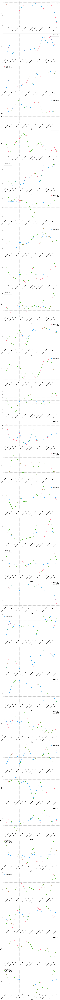

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt
import os

def plot_line_charts(df_dict, coords):
    # Ensure all DataFrames have the same index
    assert all(df_dict[key].index.equals(df_dict[next(iter(df_dict))].index) for key in df_dict), "The DataFrames have different indices."

    # Plotting configuration
    num_columns = len(next(iter(df_dict.values())).columns)
    fig, axs = plt.subplots(num_columns, 1, figsize=(15, 8 * num_columns), sharex=False)

    # Get a list of distinct colors for the plots
    num_df = len(df_dict)
    palette = sns.color_palette("husl", num_df)

    # Plot line charts in subplots for each column with different colors
    for i, column in enumerate(next(iter(df_dict.values())).columns):
        # Format coordinates for better readability
        formatted_coords = coords.apply(lambda x: f"({x['latitude']:.4f}, {x['longitude']:.4f})", axis=1)

        # Plot original values and interpolated values for each dataframe in the dictionary
        for j, (key, df) in enumerate(df_dict.items()):
            sns.lineplot(x=formatted_coords, y=df[column], ax=axs[i], label=key, marker='o', color=palette[j])
        
        axs[i].set_ylabel("Value")
        axs[i].grid(True, linestyle='--', alpha=0.7)
        axs[i].set_title(column)
        axs[i].legend()
        
        axs[i].set_xticklabels(formatted_coords, rotation=45, ha='right')  # Rotate 45 degrees for better X-axis readability

    plt.xlabel("Coordinates")
    plt.tight_layout()  # Automatically adjust the layout to avoid overlap
    plt.show()
    
def save_line_charts(df_dict, coords, output_directory):
    # Ensure all DataFrames have the same index
    assert all(df_dict[key].index.equals(df_dict[next(iter(df_dict))].index) for key in df_dict), "The DataFrames have different indices."

    # Create the output directory if it does not exist
    os.makedirs(output_directory, exist_ok=True)

    # Get a list of distinct colors for the plots
    num_df = len(df_dict)
    palette = sns.color_palette("husl", num_df)

    # Plot line charts in subplots for each column with different colors
    for column in next(iter(df_dict.values())).columns:
        # Create a directory for the column if it does not exist
        column_directory = os.path.join(output_directory, column)
        os.makedirs(column_directory, exist_ok=True)

        # Create a new figure
        fig, ax = plt.subplots(figsize=(15, 8))

        # Format coordinates for better readability
        formatted_coords = coords.apply(lambda x: f"({x['latitude']:.4f}, {x['longitude']:.4f})", axis=1)

        # Plot original values and interpolated values for each dataframe in the dictionary
        for j, (key, df) in enumerate(df_dict.items()):
            sns.lineplot(x=formatted_coords, y=df[column], ax=ax, label=key, marker='o', color=palette[j])

        ax.set_ylabel("Value")
        ax.grid(True, linestyle='--', alpha=0.7)
        ax.set_title(column)
        ax.legend()
        ax.set_xticklabels(formatted_coords, rotation=45, ha='right')  # Rotate 45 degrees for better X-axis readability

        # Save the plot in the specific directory
        output_path = os.path.join(column_directory, f"{column}.png")
        plt.savefig(output_path)
        plt.close()            
                    
# Specify the output directory
output_directory = 'images/map1/coords/'

dataframes_dict = {
    "Original Nutrients": original_nutrients,
    "Universal Interpolation": map1_universal_interpolation_nutrients,
    "Ordinary Interpolation": map1_ordinary_interpolation_nutrients,
    # "Linear Interpolation": map1_linear_interpolation_nutrients,
    # "Nearest Neighbors Interpolation": map1_nearest_neighbors_interpolation_nutrients,
    # "KNN Regression Interpolation": map1_knn_regression_interpolation_nutrients,
    # "Interp1d Interpolation": map1_interp1d_interpolation_nutrients
}

# save_line_charts(dataframes_dict, coords, output_directory)
# plot_line_charts(dataframes_dict, coords)

# Talhão 2

In [12]:
map2_nutrients_df = pd.read_csv('data/map2/nutrients/nutrients.csv')
map2_universal_interpolated_df = pd.read_csv('data/map2/interpolation/universal_interpolation_df.csv')
map2_ordinary_interpolated_df = pd.read_csv('data/map2/interpolation/ordinary_interpolation_df.csv')
map2_linear_interpolated_df = pd.read_csv('data/map2/interpolation/linear_interpolation_df.csv')
map2_nearest_neighbors_interpolated_df = pd.read_csv('data/map2/interpolation/nearest_neighbors_interpolation_df.csv')
map2_knn_regression_interpolated_df = pd.read_csv('data/map2/interpolation/knn_regression_interpolation_df.csv')
map2_interp1d_interpolated_df = pd.read_csv('data/map2/interpolation/interp1d_interpolation_df.csv')


# Get closest samples using Universal Kriging interpolation
map2_universal_interpolation_closest_points = get_closest_samples(map2_nutrients_df, map2_universal_interpolated_df, ['latitude', 'longitude'])

# Get closest samples using Ordinary Kriging interpolation
map2_ordinary_interpolation_closest_points = get_closest_samples(map2_nutrients_df, map2_ordinary_interpolated_df, ['latitude', 'longitude'])

map2_linear_interpolation_closest_points = get_closest_samples(map2_nutrients_df, map2_linear_interpolated_df, ['latitude', 'longitude'])

map2_nearest_neighbors_interpolation_closest_points = get_closest_samples(map2_nutrients_df, map2_nearest_neighbors_interpolated_df, ['latitude', 'longitude'])

map2_knn_regression_interpolation_closest_points = get_closest_samples(map2_nutrients_df, map2_knn_regression_interpolated_df, ['latitude', 'longitude'])

map2_interp1d_interpolation_closest_points = get_closest_samples(map2_nutrients_df, map2_interp1d_interpolated_df, ['latitude', 'longitude'])

# Saving closest points to CSV files 
map2_universal_interpolation_closest_points.to_csv('data/map2/closest_points/universal_interpolation_closest_points.csv')
map2_ordinary_interpolation_closest_points.to_csv('data/map2/closest_points/ordinary_interpolation_closest_points.csv')
map2_knn_regression_interpolation_closest_points.to_csv('data/map2/closest_points/knn_regression_interpolation_closest_points.csv')
map2_nearest_neighbors_interpolation_closest_points.to_csv('data/map2/closest_points/nearest_neighbors_interpolation_closest_points.csv')
map2_linear_interpolation_closest_points.to_csv('data/map2/closest_points/linear_interpolation_closest_points.csv')
map2_interp1d_interpolation_closest_points.to_csv('data/map2/closest_points/interp1d_interpolation_closest_points.csv')

# Display the DataFrame of closest points obtained using Universal Kriging
map2_ordinary_interpolation_closest_points

,latitude,longitude,B01.tiff,B02.tiff,B03.tiff,B04.tiff,B05.tiff,B06.tiff,B07.tiff,B08.tiff,...,DRIS_Ca,DRIS_Mg,DRIS_S,DRIS_B,DRIS_Cu,DRIS_Fe,DRIS_Mn,DRIS_Zn,IMS,IBN
515,-22.319293,-52.670565,0.0219,0.0219,0.0489,0.0199,0.0837,0.4604,0.6233,0.6242,...,-0.4735,0.184935,-1.299347,-0.6425,-0.814578,1.788,0.596965,-1.024012,0.831342,11.858977
535,-22.319293,-52.668767,0.0211,0.0232,0.0495,0.0180,0.0821,0.4729,0.6302,0.6230,...,-0.4735,-0.203545,-1.314372,-0.6425,-2.467516,1.788,1.094408,0.216299,0.570616,12.089571
555,-22.319293,-52.666970,0.0207,0.0202,0.0491,0.0184,0.0812,0.4714,0.6233,0.6225,...,-0.4735,-0.413139,-1.328167,-0.6425,-2.605536,1.788,1.064092,0.174895,0.384420,12.283841
2406,-22.321119,-52.672362,0.0197,0.0210,0.0484,0.0188,0.0805,0.4596,0.6201,0.6204,...,-0.4735,-0.077999,-1.292647,-0.6425,-2.349836,1.788,1.200554,0.454654,0.611710,11.871241
2426,-22.321119,-52.670565,0.0209,0.0221,0.0487,0.0180,0.0813,0.4653,0.6290,0.6175,...,-0.4735,-0.216730,-1.301178,-0.6425,-1.895349,1.788,1.118171,0.319252,0.555940,11.974539
2446,-22.321119,-52.668767,0.0210,0.0212,0.0499,0.0171,0.0790,0.4707,0.6365,0.6311,...,-0.4735,-0.338360,-1.310634,-0.6425,-2.383211,1.788,1.153790,0.509347,0.499190,12.113765
2466,-22.321119,-52.666970,0.0205,0.0232,0.0503,0.0191,0.0813,0.4779,0.6386,0.6336,...,-0.4735,-0.527953,-1.324148,-0.6425,-2.255886,1.788,1.145420,0.245366,0.328047,12.309746
2486,-22.321119,-52.665172,0.0213,0.0301,0.0602,0.0571,0.0996,0.4262,0.5479,0.5223,...,-0.4735,-0.431187,-1.321814,-0.6425,-2.456089,1.788,1.182698,0.429428,0.379913,12.282435
4748,-22.322944,-52.672362,0.0214,0.0217,0.0478,0.0194,0.0798,0.4570,0.6119,0.6011,...,-0.4735,-0.144328,-1.287686,-0.6425,-2.721589,1.788,1.356512,0.693240,0.546717,11.887626
4768,-22.322944,-52.670565,0.0209,0.0204,0.0468,0.0176,0.0765,0.4575,0.6179,0.6162,...,-0.4735,-0.265852,-1.294018,-0.6425,-2.550330,1.788,1.393159,0.660268,0.507146,11.984333


In [13]:
map2_original_nutrients = map2_nutrients_df.iloc[:, 2:].reset_index(drop=True)

# Extracting nutrient values from closest points obtained using Universal Kriging
map2_universal_interpolation_nutrients = map2_universal_interpolation_closest_points.iloc[:, 14:].reset_index(drop=True)

# Extracting nutrient values from closest points obtained using Ordinary Kriging
map2_ordinary_interpolation_nutrients = map2_ordinary_interpolation_closest_points.iloc[:, 14:].reset_index(drop=True)

map2_linear_interpolation_nutrients = map2_linear_interpolation_closest_points.iloc[:, 14:].reset_index(drop=True)

map2_nearest_neighbors_interpolation_nutrients = map2_nearest_neighbors_interpolation_closest_points.iloc[:, 14:].reset_index(drop=True)

map2_knn_regression_interpolation_nutrients = map2_knn_regression_interpolation_closest_points.iloc[:, 14:].reset_index(drop=True)

map2_interp1d_interpolation_nutrients = map2_interp1d_interpolation_closest_points.iloc[:, 14:].reset_index(drop=True)

map2_universal_interpolation_nutrients_stats, original_stats = compare_dataframes_statistics(map2_original_nutrients, map2_universal_interpolation_nutrients)
map2_ordinary_interpolation_nutrients_stats, original_stats = compare_dataframes_statistics(map2_original_nutrients, map2_ordinary_interpolation_nutrients)
map2_linear_interpolation_nutrients_stats, original_stats = compare_dataframes_statistics(map2_original_nutrients, map2_linear_interpolation_nutrients)
map2_nearest_neighbors_interpolation_nutrients_stats, original_stats = compare_dataframes_statistics(map2_original_nutrients, map2_nearest_neighbors_interpolation_nutrients)
map2_knn_regression_interpolation_nutrients_stats, original_stats = compare_dataframes_statistics(map2_original_nutrients, map2_knn_regression_interpolation_nutrients)
map2_interp1d_interpolation_nutrients_stats, original_stats = compare_dataframes_statistics(map2_original_nutrients, map2_interp1d_interpolation_nutrients)

abs(map2_universal_interpolation_nutrients_stats - original_stats)

,N,P,K,Ca,Mg,S,B,Cu,Fe,Mn,...,DRIS_Ca,DRIS_Mg,DRIS_S,DRIS_B,DRIS_Cu,DRIS_Fe,DRIS_Mn,DRIS_Zn,IMS,IBN
count,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
mean,0.007656,0.002352,0.000407,0.002937,0.000076,0.000664,0.000855,0.005304,0.276629,0.018987,...,0.003677,0.000441,0.006829,0.002095,0.000871,0.027648,0.002845,0.000606,0.001539,0.033573
std,0.909572,0.026929,0.001847,0.194517,0.003354,0.008853,0.000081,0.078316,20.486274,0.377078,...,0.048704,0.130803,0.043868,0.018397,0.045631,0.158739,0.151330,0.000019,0.021723,0.163157
min,1.655743,0.039581,0.007132,0.269756,0.006498,0.017632,0.017026,0.034603,15.017404,0.991018,...,0.107555,0.210645,0.072562,0.027894,0.056160,0.267262,0.521580,0.000276,0.022366,0.500114
25%,0.661532,0.026680,0.003191,0.154926,0.001398,0.003727,0.000749,0.070547,10.727278,0.284655,...,0.020194,0.037972,0.004193,0.011214,0.023319,0.052827,0.054495,0.000189,0.002967,0.064491
50%,0.121672,0.004018,0.001479,0.000699,0.000530,0.000813,0.005432,0.032749,9.065008,0.034060,...,0.019243,0.019781,0.013509,0.001391,0.000971,0.069873,0.015712,0.000723,0.001455,0.016546
75%,0.752638,0.009115,0.000033,0.171990,0.001402,0.006176,0.007706,0.017258,5.895143,0.153268,...,0.031778,0.016456,0.047761,0.022662,0.001191,0.072236,0.042909,0.000925,0.012028,0.014892
80%,0.735591,0.012240,0.001255,0.194096,0.003702,0.016828,0.009699,0.053032,2.122625,0.177460,...,0.034446,0.027648,0.062265,0.018918,0.009422,0.029815,0.071830,0.000392,0.005565,0.035862
85%,0.845783,0.017102,0.000375,0.210822,0.004700,0.015743,0.007070,0.100839,19.213960,0.214418,...,0.038328,0.084993,0.042958,0.025450,0.042409,0.184879,0.108263,0.001315,0.002845,0.063994
90%,0.969274,0.057315,0.000332,0.195061,0.005018,0.006741,0.004614,0.182646,21.687111,0.638183,...,0.039680,0.077709,0.041164,0.013663,0.076899,0.129938,0.167128,0.000072,0.008669,0.109127


C:\Users\Lucas\AppData\Local\Temp\ipykernel_13080\2858083923.py:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(formatted_coords, rotation=45, ha='right')  # Rotate 45 degrees for better X-axis readability
C:\Users\Lucas\AppData\Local\Temp\ipykernel_13080\2858083923.py:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(formatted_coords, rotation=45, ha='right')  # Rotate 45 degrees for better X-axis readability
C:\Users\Lucas\AppData\Local\Temp\ipykernel_13080\2858083923.py:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(formatted_coords, rotation=45, ha='right')  # Rotate 45 degrees for better X-axis readability
C:\Users\Lucas\AppData\Local\Temp\ipykernel_13080\28580

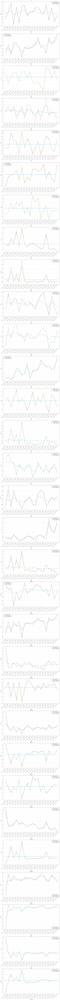

In [14]:
output_directory = 'images/map2/coords'
coords = map2_nutrients_df.iloc[:, 0:2].reset_index(drop=True)

# Selecting columns of interest for line charts
# columns_of_interest = ['Fe', 'Si']

dataframe_dict = {
    "Original Nutrients": map2_original_nutrients,
    "Universal Interpolation": map2_universal_interpolation_nutrients,
    "Ordinary Interpolation": map2_ordinary_interpolation_nutrients,
    # "Linear Interpolation": map2_linear_interpolation_nutrients,
    # "Nearest Neighbors Interpolation": map2_nearest_neighbors_interpolation_nutrients,
    # "KNN Regression Interpolation": map2_knn_regression_interpolation_nutrients,
    # "Interp1d Interpolation": map2_interp1d_interpolation_nutrients
}

# save_line_charts(dataframe_dict, coords, output_directory)
plot_line_charts(dataframe_dict, coords)